# DSM: Intro to TensorFlow 2

What is this workshop about?

1. The three APIs of TensorFlow 2
2. Airbnb price regressions
3. Getting insights from gradients

### How to run the notebook?

* The notebook can be run on Google Colab or a Jupyter Notebook 
* https://github.com/yaniv256/workshops/blob/master/notebooks/TF2-intro-Airbnb.ipynb
* Or web search Colab, go to the `Github` tab, enter `yaniv256`, pick the `workshops` repository, and pick the `TF2-intro-Airbnb.ipynb` notebook.

## Why TensorFlow 2?

TF2: "We will add your biological and technological distinctiveness to our own... Resistance is futile."
* Freely copied the best of PyTorch
* Keras was assimilated
* Still most popular (according to [Google trends](https://trends.google.com/trends/explore?date=today%205-y&geo=US&q=TensorFlow,PyTorch,Keras))


## The three APIs

1. Sequencial: when all you need is a stack of layers
2. Functional: when you want to connect layers in whatever way
3. Subclassing: Object Oriented + connect on input

And there's also TensorFlow itself - good for any symbolic computation.

### Example: Sequencial API

In [1]:
import tensorflow.keras as keras

def build_model_sequential(input_shape, activation='relu', width=128):

    model = keras.Sequential()
    model.add(keras.layers.Dense(width, activation=activation,
                                 input_shape=input_shape))
    model.add(keras.layers.Dense(width, activation=activation))
    model.add(keras.layers.Dense(1))

    return model

build_model_sequential((15,))

### Example: Functional API

In [2]:
import tensorflow.keras as keras

def build_model_functional(input_shape, activation='relu', width=128):

    inputs = keras.Input(shape=input_shape)
    x = keras.layers.Dense(width, activation=activation)(inputs)
    x = keras.layers.Dense(width, activation=activation)(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

build_model_functional((15,))

### Example: Subclassing API

In [3]:
def build_model_subclassing(activation='relu', width=128):

    class MyModel(keras.Model):
        def __init__(self):
            super(MyModel, self).__init__()
            self.dense1 = keras.layers.Dense(width, activation=activation)
            self.dense2 = keras.layers.Dense(width, activation=activation)
            self.out = keras.layers.Dense(1)

        def call(self, x):
            x = self.dense1(x)
            x = self.dense2(x)
            return self.out(x)

    model = MyModel()

    return model

build_model_subclassing()

<__main__.build_model_subclassing.<locals>.MyModel at 0x63f0c2550>

### Which API should you learn?

* Sequencial is good enough for most tasks
* Same code in Functional is just as short and no less clear

* If you want to build reusable objects, go for Subclassing
* Otherwise, Functional is as powerful and more readable

## Airbnb price regressions

* Predict a listings price based on its features
* Valuate listings
* Valuate locations

### Valuation vs. prediction

* Making a best prediction isn't the same as estimating value
* Many listings are overpriced
* Lots of reviews indicate price is low relative to listing value

## Insight from gradients

* What is the sensitivity of a prediction to each input?
* Which variables are most important?
* How to examine non-linearities and interactions?

Answers to all: gradients.

# Airbnb data

Data source: http://insideairbnb.com/index.html

## Load Twin Cities data

In [4]:
%%writefile airbnbloader.py
from collections import OrderedDict
import pandas as pd
from datetime import datetime
import numpy as np


def load(date='2019-06-02', location='united-states/mn/twin-cities-msa'):

    filename = (
        'http://data.insideairbnb.com/{}/{}/data/listings.csv.gz'.format(
            location, date))

    data = pd.read_csv(filename)

    data.price = data.price.apply(lambda x: float(x[1:].replace(',', '')))

    weekday = data.last_review.dropna().apply(
      lambda x: datetime.strptime(x, '%Y-%m-%d').strftime('%A'))
    weekday.name = 'last_review_weekday'
    data = data.join(weekday)

    days_since_last_review = data.last_review.dropna().apply(
        lambda x: (datetime.strptime(date, '%Y-%m-%d')
                   - datetime.strptime(x, '%Y-%m-%d')).days)
    days_since_last_review.name = 'days_since_last_review'
    data = data.join(days_since_last_review)

    features = data[[
        'price',
        'latitude',
        'longitude',
        'room_type',
        'accommodates',
        'bathrooms',
        'bedrooms',
        'beds',
        'minimum_nights',
        'days_since_last_review',
        'number_of_reviews',
        'reviews_per_month',
        'calculated_host_listings_count',
        'availability_30',
        'availability_365'
        ]]

    features.dropna(inplace=True)
    features = features[features.availability_365 != 0]
    features = features[features.availability_365 != 365]

    onehot_room_type = pd.get_dummies(features['room_type'])

    onehot_room_type.drop(['Private room'], axis=1, inplace=True)

    features = pd.concat([features, onehot_room_type], axis=1)

    targets = features['price'].apply(lambda x: np.log(x+1))

    features.drop(['price', 'room_type'], axis=1, inplace=True)

    return features, targets, data


def all_value_counts(data, n=5):

    return OrderedDict(
        (field,
         dict(n=len(set(data[field])),
              top=list(zip(
                  data[field].value_counts().head(n).index,
                  data[field].value_counts().head(n).values))))
        for field in data.columns)

Overwriting airbnbloader.py


Some dates that are available for `location='united-states/mn/twin-cities-msa':`
* Last June: date='2019-06-02'
* Last January: date='2020-01-04'
* Most recent: date='2020-04-14'

In [5]:
import importlib
import warnings
import airbnbloader

warnings.filterwarnings('ignore')

features, targets, data = airbnbloader.load(
    location='united-states/mn/twin-cities-msa',
    date='2019-06-02'
)

features.shape, targets.shape, data.shape

((2951, 15), (2951,), (6607, 108))

In [6]:
features.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,45.00886,-93.23407,5,1.0,1.0,2.0,2,94.0,212,1.81,2,15,165,1,0
1,44.94566,-93.35721,5,1.0,2.0,2.0,2,39.0,150,1.37,1,28,363,0,0
2,44.91878,-93.23038,3,1.0,2.0,2.0,2,28.0,166,1.57,2,8,341,0,0
3,44.92053,-93.35049,3,1.0,1.0,1.0,2,188.0,26,0.31,2,0,335,1,0
7,44.92136,-93.22873,3,1.0,2.0,2.0,2,261.0,15,0.16,2,7,340,0,0


Split to train and test data sets.

In [7]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    features,
    targets,
    test_size=0.25,
    random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2213, 15), (738, 15), (2213,), (738,))

## Map listings

In [8]:
%%writefile mapairbnb.py
import plotly.graph_objects as go


def plot(data, features, color_by, color_title, zoom=10, hover=True,
         center=dict(lat=44.981944, lon=-93.269167)):

    data_ = data.loc[features.index]

    if hover:
        text = [
            '{}  <br> ${}'.format(data_.name[i], data_.price[i])
            + '<br>Number of reviews: {}<br>'.format(
                data_.number_of_reviews[i])
            + ' <a href="{}">link</a>'.format(
                data_.listing_url[i])
            + '<br>Availability: {}'.format(data_.availability_365[i])
            + '<br>Days since last review: {}'.format(
                features.days_since_last_review[i])
            + '<br>Accommodates: {}'.format(features.accommodates[i])
            for i in data_.index]
    else:
        text = ''

    fig = go.Figure(go.Scattermapbox(
        lat=features.latitude,
        lon=features.longitude,
        mode='markers',
        text=text,
        hoverinfo='text',
        marker=dict(color=color_by, colorscale='rainbow',
                    colorbar=dict(title=color_title), size=9),
        ))

    fig.update_layout(
        hovermode='x',
        hoverdistance=20,
        mapbox_style='white-bg',
        autosize=False,
        width=800,
        height=400,
        mapbox_layers=[{
            'below': 'traces', 'sourcetype': 'raster',
            'source': ['https://basemap.nationalmap.gov/arcgis/rest/services/'
                       + 'USGSImageryOnly/MapServer/tile/{z}/{y}/{x}']}],
        mapbox=dict(bearing=0, center=center, pitch=0, zoom=zoom),
        )

    fig.update_layout(margin={'r': 0, 't': 0, 'l': 0, 'b': 0})

    return fig

Overwriting mapairbnb.py


In [9]:
import mapairbnb

mapairbnb.plot(data, features, color_by=targets, color_title='Log price')

# OLS Regression
Let's run an OLS regression as a benchmark

In [10]:
import statsmodels.api as sm
import pandas as pd

X_train_with_const = sm.add_constant(
    pd.DataFrame(X_train, columns=features.columns))
X_test_with_const = sm.add_constant(
    pd.DataFrame(X_test, columns=features.columns))

results = sm.OLS(y_train, X_train_with_const).fit(cov_type='HC0')

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     225.5
Date:                Tue, 19 May 2020   Prob (F-statistic):               0.00
Time:                        16:30:39   Log-Likelihood:                -1952.4
No. Observations:                2213   AIC:                             3937.
Df Residuals:                    2197   BIC:                             4028.
Df Model:                          15                                         
Covariance Type:                  HC0                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

## Valuate listings

* Lots of reviews indicate lower prices relative to the value
* We need to fix the review variables on some constant
* Let's use the median.

In [11]:
%%writefile fixcolumns.py
import numpy as np
import pandas as pd


def fix(data, fix_columns, fix_on):

    all_fixed = pd.DataFrame(
        np.tile(fix_on, (len(data), 1)),
        columns=data.columns)

    all_fixed.index = data.index

    fixed_data = data.copy()

    fixed_data[fix_columns] = all_fixed[fix_columns]

    return fixed_data


Overwriting fixcolumns.py


In [12]:
import fixcolumns

fix_reviews = fixcolumns.fix(
    data=features,
    fix_columns=[
        'days_since_last_review',
        'number_of_reviews',
        'reviews_per_month'],
    fix_on=features.median().values
    )

fix_reviews.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,45.00886,-93.23407,5,1.0,1.0,2.0,2,19.0,18.0,1.39,2,15,165,1,0
1,44.94566,-93.35721,5,1.0,2.0,2.0,2,19.0,18.0,1.39,1,28,363,0,0
2,44.91878,-93.23038,3,1.0,2.0,2.0,2,19.0,18.0,1.39,2,8,341,0,0
3,44.92053,-93.35049,3,1.0,1.0,1.0,2,19.0,18.0,1.39,2,0,335,1,0
7,44.92136,-93.22873,3,1.0,2.0,2.0,2,19.0,18.0,1.39,2,7,340,0,0


Now we can use the review-constant listings to estimate the "right" price for listings and compare that to what it is listed for. 

In [13]:
ols_predicted = results.predict(
    sm.add_constant(fix_reviews, has_constant='add'))
overpriced = targets-ols_predicted
mapairbnb.plot(
    data, features, color_by=overpriced, color_title='Diff log price')

## Location, location, location!

To see the effect of location we need to hold everything else fixed. One approach is to pick the median value for everything other than location and use that to make predictions.

In [14]:
location_only = fixcolumns.fix(
    data=features,
    fix_columns=features.columns[2:],
    fix_on=features.describe().loc['50%'].values
    )

location_only.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,45.00886,-93.23407,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
1,44.94566,-93.35721,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
2,44.91878,-93.23038,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
3,44.92053,-93.35049,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
7,44.92136,-93.22873,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0


Fixing all but location we can map the value of a location.

In [15]:
import numpy as np

location_predicted = results.predict(
    sm.add_constant(location_only, has_constant='add'))

mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
               color_title='Predicted price', zoom=7, hover=False)

This clearly fails. A linear model can only generate linear maps, but location isn't linear.

# TensorFlow II
* Coding in TensorFlow is very similar to coding with NumPy 
* Just use TensorFlow functions
* Unlike NumPy, TensorFlow keeps track of derivatives

## Adding a custom metric: $R^2$


To get a feel for pure TensorFlow let's write a TensorFlow function calculating $R^2$. Recall that 

$$R^2=1-\frac{\Sigma (y-\hat{y})^2}{\Sigma (y-\bar{y})^2}$$

TensorFlow doesn't provide an $R^2$ metric, most likely because

1. $R^2$ computed on each batch is a downward biased estimate of whole epoch $R^2$
2. Average batch $R^2$ will not equal whole epoch $R^2$

We will use the usual small sample bias correction

$$\tilde{R}^2=1-\frac{\Sigma (y-\hat{y})^2}{\frac{n}{n-1}\Sigma (y-\bar{y})^2}$$

In [16]:
%%writefile tf_r2.py
import tensorflow as tf

def R_squared(y_true, y_pred):

    # TensorFlow uses 'float32' as the default type and often raises an error
    # when you mix 'float32' and 'float64' in calculations. Since 'float64' is
    # the Python default, this happens a lot. Casting everything to 'float32' 
    # is your best option.
    y_true = tf.cast(y_true, 'float32')
    y_pred = tf.cast(y_pred, 'float32')

    residual_var = tf.reduce_sum(tf.square(y_true - y_pred))
    total_var = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))

    # Adjust for small batch bias
    n = tf.cast(tf.size(y_true), 'float32')
    total_var *= n/(n-1)

    return (1.0 - residual_var/total_var)

Overwriting tf_r2.py


Tensorflow functions produce tensors which are only computed when you call `.numpy()` on them.

In [17]:
import numpy as np
import tf_r2

OLS_r2 = dict(
    Train=tf_r2.R_squared(
        y_train,
        results.predict(X_train_with_const)
        ).numpy(),
    Test=tf_r2.R_squared(
        y_test,
        results.predict(X_test_with_const)
        ).numpy()
    )

pd.DataFrame(pd.Series(OLS_r2), columns=['OLS R2']).transpose()

,Train,Test
OLS R2,0.601956,0.540067


## Add dropout
To boost performance a little we can add dropout regularization layers. Here's how in each of the three APIs.

In [18]:
%%writefile simple_dnn.py

import tensorflow.keras as keras

# The sequencial API: create one layer at a time and add it to the model. We 
# don't have to provide the shape of the input, but if we don't the 
# construction of the model will be delayed until the first call to `fit()`


def build_model_sequential(
        input_shape=None,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    model = keras.Sequential()
    for i in range(n_hidden):
        if i == 0 and input_shape:
            model.add(keras.layers.Dense(width,
                                         activation=activation,
                                         input_shape=input_shape))
        else:
            model.add(keras.layers.Dense(width, activation=activation))
        model.add(keras.layers.Dropout(dropout))
    model.add(keras.layers.Dense(1))

    return model

# The functional API: create layers and apply them, all before input. We have
# to provide the shape of the input to `keras.Input`.


def build_model_functional(
        input_shape,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    inputs = keras.Input(shape=input_shape)
    x = inputs
    for i in range(n_hidden):
        x = keras.layers.Dense(width, activation=activation)(x)
        x = keras.layers.Dropout(dropout)(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

# The subclassing API: create layers and store them, apply only on input. We 
# don't need to provide the shape of the input.


def build_model_subclassing(
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    class MyModel(keras.Model):
        def __init__(self):
            super(MyModel, self).__init__()
            self.dense = []
            self.dropout = []
            for i in range(n_hidden):
                self.dense.append(
                    keras.layers.Dense(
                        width, activation=activation))
                self.dropout.append(keras.layers.Dropout(dropout))
            self.out = keras.layers.Dense(1)

        def call(self, x):
            for i in range(n_hidden):
                x = self.dense[i](x)
                x = self.dropout[i](x)
            return self.out(x)

    model = MyModel()

    return model

Overwriting simple_dnn.py


You can't ask for `summary()` when not providing input_shape as the layers only 
get built on the first input.

In [19]:
import simple_dnn

simple_dnn.build_model_sequential(X_train.shape[1:]).summary()

# This will work:
# simple_dnn.build_model_functional(X_train.shape[1:]).summary()

# This will not:
# keras_dnn.build_model_sequential().summary()
# keras_dnn.build_model_subclassing().summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 128)               2048      
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 128)               16512     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 129       
Total params: 18,689
Trainable params: 18,689
Non-trainable params: 0
_________________________________________________________________


## Standard scale the features
Neural networks perform much better on scaled inputs.

In [20]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(X_train_scaled.mean(), X_test_scaled.mean())
print(X_train_scaled.std(), X_test_scaled.std())

2.6254441709490915e-15 0.012337521054669603
1.0 1.040016761260583


## Training 
Training has the same interface for all APIs. Here we'll
* Minimize Mean Square Error (MSE) using Stocastic Gradient Decent
* Keep track of $R^2$
* Use only full batchs ($R^2$ needs this)
* Stop after no improvment on validation for 30 epochs
* Get back to best performing model at the end

In [21]:
%%writefile train_dnn.py

import tensorflow.keras as keras
from tf_r2 import R_squared

def train(model, X_train, y_train, X_test, y_test, 
          optimizer=keras.optimizers.SGD(0.025),
          batch_size = 32, epochs=1000, patience=30):
    
    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=[R_squared])

    X_train = X_train[:-(len(X_train) % batch_size)]
    y_train = y_train[:-(len(y_train) % batch_size)]
    X_test = X_test[:-(len(X_test) % batch_size)]
    y_test = y_test[:-(len(y_test) % batch_size)]

    early_stopping = keras.callbacks.EarlyStopping(
        patience=patience,
        restore_best_weights=True)

    history = model.fit(
        X_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_data=(X_test, y_test),
        callbacks=[early_stopping]
    )

    return history


Overwriting train_dnn.py


In [22]:
import train_dnn

# You can pick any of the following
# model = simple_dnn.build_model_sequential()
# model = simple_dnn.build_model_sequential(X_train.shape[1:])
model = simple_dnn.build_model_functional(X_train.shape[1:])
# model = simple_dnn.build_model_subclassing()

history = train_dnn.train(model, X_train_scaled, y_train,
                          X_test_scaled, y_test)

Train on 2208 samples, validate on 736 samples
Epoch 1/1000
2208/2208 [==============================] - 1s 303us/sample - loss: 1.6659 - R_squared: -1.4382 - val_loss: 0.6384 - val_R_squared: 0.1511
Epoch 2/1000
2208/2208 [==============================] - 0s 58us/sample - loss: 0.6475 - R_squared: 0.2000 - val_loss: 0.4302 - val_R_squared: 0.4377
Epoch 3/1000
2208/2208 [==============================] - 0s 74us/sample - loss: 0.5420 - R_squared: 0.3336 - val_loss: 0.4616 - val_R_squared: 0.4125
Epoch 4/1000
2208/2208 [==============================] - 0s 42us/sample - loss: 0.4890 - R_squared: 0.4180 - val_loss: 0.3873 - val_R_squared: 0.4964
Epoch 5/1000
2208/2208 [==============================] - 0s 54us/sample - loss: 0.4521 - R_squared: 0.4495 - val_loss: 0.3908 - val_R_squared: 0.4955
Epoch 6/1000
2208/2208 [==============================] - 0s 52us/sample - loss: 0.4412 - R_squared: 0.4609 - val_loss: 0.3870 - val_R_squared: 0.5066
Epoch 7/1000
2208/2208 [=====================

2208/2208 [==============================] - 0s 46us/sample - loss: 0.2709 - R_squared: 0.6744 - val_loss: 0.3215 - val_R_squared: 0.5894
Epoch 55/1000
2208/2208 [==============================] - 0s 52us/sample - loss: 0.2728 - R_squared: 0.6689 - val_loss: 0.3147 - val_R_squared: 0.5951
Epoch 56/1000
2208/2208 [==============================] - 0s 46us/sample - loss: 0.2713 - R_squared: 0.6763 - val_loss: 0.3363 - val_R_squared: 0.5742
Epoch 57/1000
2208/2208 [==============================] - 0s 44us/sample - loss: 0.2736 - R_squared: 0.6716 - val_loss: 0.3166 - val_R_squared: 0.5960
Epoch 58/1000
2208/2208 [==============================] - 0s 41us/sample - loss: 0.2685 - R_squared: 0.6724 - val_loss: 0.3081 - val_R_squared: 0.6046
Epoch 59/1000
2208/2208 [==============================] - 0s 40us/sample - loss: 0.2721 - R_squared: 0.6729 - val_loss: 0.3068 - val_R_squared: 0.6024
Epoch 60/1000
2208/2208 [==============================] - 0s 46us/sample - loss: 0.2573 - R_squared: 

Epoch 108/1000
2208/2208 [==============================] - 0s 43us/sample - loss: 0.2325 - R_squared: 0.7236 - val_loss: 0.3135 - val_R_squared: 0.6005
Epoch 109/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.2318 - R_squared: 0.7244 - val_loss: 0.3174 - val_R_squared: 0.5972
Epoch 110/1000
2208/2208 [==============================] - 0s 40us/sample - loss: 0.2294 - R_squared: 0.7224 - val_loss: 0.3182 - val_R_squared: 0.5956
Epoch 111/1000
2208/2208 [==============================] - 0s 40us/sample - loss: 0.2325 - R_squared: 0.7213 - val_loss: 0.3250 - val_R_squared: 0.5873
Epoch 112/1000
2208/2208 [==============================] - 0s 47us/sample - loss: 0.2340 - R_squared: 0.7113 - val_loss: 0.3074 - val_R_squared: 0.6069
Epoch 113/1000
2208/2208 [==============================] - 0s 40us/sample - loss: 0.2297 - R_squared: 0.7183 - val_loss: 0.3155 - val_R_squared: 0.5979
Epoch 114/1000
2208/2208 [==============================] - 0s 40us/sample - loss:

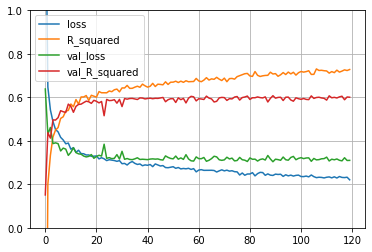

In [23]:
pd.DataFrame(history.history).plot(ylim=(0, 1), grid=True)

## Performance

In [24]:
import tf_r2

DNN_r2 = dict(
    Train=tf_r2.R_squared(
        y_train, model.predict(X_train_scaled).flatten()
        ).numpy(),
    Test=tf_r2.R_squared(
        y_test, model.predict(X_test_scaled).flatten()
        ).numpy()
    )

pd.DataFrame([OLS_r2, DNN_r2], index=['OLS R2', 'DNN R2'])

,Train,Test
OLS R2,0.601956,0.540067
DNN R2,0.760207,0.619105


## Valuate listings

In [25]:
dnn_predicted = model.predict(scaler.transform(fix_reviews)).flatten()
overpriced = targets-dnn_predicted
mapairbnb.plot(data, features, color_by=overpriced, color_title='Diff log price')

## Location, location, location, again!



In [26]:
location_predicted = model.predict(scaler.transform(location_only)).flatten()

mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
               color_title='Predicted price', zoom=8, hover=False)

Still a faliure but at least it's not linear anymore.

# Insight from gradients

Real easy to compute derivatives in TF2
* Define inputs as TF variables
* Do TF calculations under a `with tf.GradientTape() as tape:`
* Call `tape.gradient(outputs, inputs)`

But use `model()` instead of `model.predict()`

In [27]:
import tensorflow as tf

X = tf.Variable(features.values, dtype='float32')

with tf.GradientTape() as tape:
    X_std = (X-scaler.mean_) / scaler.scale_
    predictions = model(X_std)   # model.predict() is for non-TF inputs

dnn_coefs = tape.gradient(predictions, X).numpy()

dnn_coefs = pd.DataFrame(dnn_coefs,
                         columns=features.columns,
                         index=features.index)
dnn_coefs.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,-0.479851,0.363918,0.070182,-0.011684,0.080813,-0.040874,-0.013975,0.000276,-0.001281,-0.027755,-0.002540,0.009138,-0.000155,0.613595,-0.516790
1,-0.407069,0.253117,0.068311,0.020736,0.077259,0.010407,-0.008313,0.000649,-0.000470,-0.070211,-0.012031,0.007833,-0.000450,0.214115,-0.150224
2,-0.365589,0.134897,0.060379,0.016402,0.123009,-0.041099,-0.010132,0.000452,-0.000440,-0.034505,-0.010183,-0.001106,0.000435,0.282671,-0.788379
3,1.962100,0.312736,0.017886,0.204512,0.071934,0.159025,-0.025169,0.001496,-0.005191,-0.211905,0.040285,0.009019,0.000728,1.161723,-1.535210
7,1.834128,0.226397,0.068541,-0.107769,0.167086,0.159376,-0.032947,-0.000622,-0.008114,-0.289666,-0.007977,0.011005,-0.001155,0.559267,-1.200817


## Compare with OLS
* Coefficients are different for every observation 
* Avarage is still comparable to OLS

In [28]:
ols_coef = pd.Series(results.params[1::], name='OLS_coef')

dnn_mean_coef = pd.Series(dnn_coefs.mean(axis=0),
                          index=features.columns,
                          name='DNN_mean_grad')

pd.DataFrame([ols_coef, dnn_mean_coef]).transpose()

,OLS_coef,DNN_mean_grad
latitude,-0.135648,-0.023954
longitude,0.058068,-0.001101
accommodates,0.046694,0.037400
bathrooms,0.195347,0.154324
bedrooms,0.112668,0.058580
beds,-0.022113,0.053555
minimum_nights,-0.005416,-0.011901
days_since_last_review,0.000704,0.000561
number_of_reviews,-0.000174,-0.003194
reviews_per_month,-0.068020,-0.119249


## Variable Importance
For each observation we can estimate the importance of each variable by multiplying the coefficients by the deviation of inputs from their mean.

In [29]:
# Approximate each variable's effect by multiplying its absolute deviation 
# from its mean by the sensitivity of prediction to that variable.
abs_effect = (dnn_coefs * (features-features.mean())).abs()

# Compute per-row sum and reshape it to a vertical vector
abs_effect_sum = np.reshape(abs_effect.sum(axis=1).values, (len(features), 1))

# Divide by the sum so that effects sum to 1
per_obs_importance = abs_effect / abs_effect_sum

per_obs_importance.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,0.020002,0.013151,0.019683,0.007611,0.113616,0.040068,0.025181,0.002058,0.344500,0.009864,0.011220,0.049635,0.005324,0.329482,0.008605
1,0.023937,0.041120,0.020350,0.014349,0.010633,0.010836,0.015911,0.053070,0.086776,0.076891,0.076077,0.211264,0.129034,0.227095,0.002657
2,0.039338,0.006279,0.187613,0.011898,0.017746,0.044862,0.020329,0.047274,0.097081,0.027814,0.050088,0.006547,0.114230,0.314285,0.014617
3,0.061710,0.014932,0.016709,0.044603,0.033858,0.133936,0.015183,0.076002,0.029079,0.188607,0.059578,0.053141,0.055263,0.208842,0.008558
7,0.058364,0.003447,0.065676,0.024107,0.007433,0.053647,0.020385,0.056343,0.093682,0.287347,0.012100,0.025892,0.092959,0.191752,0.006865


Averaging across observations we have a measure of variable importance.

In [30]:
mean_abs_effect = per_obs_importance.mean().sort_values(ascending=False)

pd.DataFrame(
    mean_abs_effect/mean_abs_effect.sum(),
    columns=['Variable Importance'])

,Variable Importance
Entire home/apt,0.225721
reviews_per_month,0.101829
accommodates,0.088231
number_of_reviews,0.071472
bedrooms,0.064277
bathrooms,0.063475
beds,0.061749
availability_30,0.057548
availability_365,0.055893
calculated_host_listings_count,0.051092


## Error analysis

In [31]:
%%writefile erranalysis.py

import pandas as pd
import numpy as np


def table(predictions, targets, features, data, per_obs_importance, dnn_coefs,
          mean_abs_effect):

    pred = pd.Series(predictions.numpy().flatten(),
                     index=features.index,
                     name='pred')

    err = (pred - targets).sort_values()
    err.name = 'log pred - log price'

    error_analysis = (
        features.loc[err.index]
        .join(per_obs_importance.loc[err.index], rsuffix='_importance')
        .join(dnn_coefs.loc[err.index], rsuffix='_coef')
        )

    col = []
    for index in mean_abs_effect.index:
        col.append(index + '_importance')
        col.append(index + '_coef')
        col.append(index)
    col

    error_analysis = error_analysis.reindex(col, axis=1)
    error_analysis = (
        pd.DataFrame(data.name[err.index])
        .join('<a href="' + data.listing_url[err.index] + '">link</a>')
        .join(pred[err.index].apply(np.exp))
        .join(targets[err.index].apply(np.exp))
        .join(error_analysis)
        )

    return error_analysis


Overwriting erranalysis.py


In [32]:
from IPython.display import HTML
import erranalysis

error_analysis = erranalysis.table(
    predictions, targets, features, data, per_obs_importance, dnn_coefs,
    mean_abs_effect)

HTML(error_analysis.head().to_html(escape=False))

,name,listing_url,pred,price,Entire home/apt_importance,Entire home/apt_coef,Entire home/apt,reviews_per_month_importance,reviews_per_month_coef,reviews_per_month,accommodates_importance,accommodates_coef,accommodates,number_of_reviews_importance,number_of_reviews_coef,number_of_reviews,bedrooms_importance,bedrooms_coef,bedrooms,bathrooms_importance,bathrooms_coef,bathrooms,beds_importance,beds_coef,beds,availability_30_importance,availability_30_coef,availability_30,availability_365_importance,availability_365_coef,availability_365,calculated_host_listings_count_importance,calculated_host_listings_count_coef,calculated_host_listings_count,days_since_last_review_importance,days_since_last_review_coef,days_since_last_review,latitude_importance,latitude_coef,latitude,longitude_importance,longitude_coef,longitude,minimum_nights_importance,minimum_nights_coef,minimum_nights,Shared room_importance,Shared room_coef,Shared room
2461,Private apartment! Your own entrance & parking.,link,158.991760,10000.0,0.249639,0.773176,1,0.016720,-0.015906,3.18,0.011386,0.067521,5,0.001598,-0.000072,61,0.007129,0.091510,2.0,0.110846,0.282983,1.0,0.023612,0.070732,3.0,0.258786,0.018040,27,0.076018,-0.000821,87,0.023254,0.006497,1,0.141256,0.001983,12.0,0.064767,-1.884589,44.94449,0.000355,-0.016537,-93.28084,0.011658,-0.010760,2,0.002977,0.297366,0
4122,NE Mpls. Charmer,link,47.806484,801.0,0.268759,0.177443,0,0.038101,-0.016382,3.04,0.258905,0.039455,2,0.029787,0.001057,49,0.002291,-0.001074,1.0,0.041661,0.031068,2.0,0.055098,0.014438,1.0,0.061475,0.004832,6,0.017013,-0.000087,103,0.085442,-0.012751,2,0.087517,0.000543,20.0,0.020522,-0.384477,45.00463,0.012431,0.296923,-93.23963,0.010520,-0.002078,1,0.010478,-0.414869,0
3107,Private Room in South Minneapolis,link,98.713455,1451.0,0.217374,0.832971,0,0.159406,-0.259375,0.51,0.144559,0.127859,2,0.099703,-0.007552,4,0.017331,-0.047167,1.0,0.017075,0.100290,1.0,0.063749,0.096955,1.0,0.086853,0.015987,25,0.064565,0.001047,341,0.048853,-0.031399,1,0.025025,0.001111,33.0,0.027633,-1.536214,44.93689,0.005103,0.375373,-93.29148,0.017994,-0.020630,1,0.004776,-1.097503,0
1935,Private Bedroom - 1 to 2 Guests - Women Only,link,45.822025,601.0,0.325432,0.300730,0,0.004181,-0.031990,2.12,0.185717,0.039613,2,0.023221,-0.000539,11,0.041856,0.027470,1.0,0.018415,0.026083,1.0,0.032349,0.011865,1.0,0.157938,0.008280,0,0.019009,-0.000210,133,0.105237,-0.016312,1,0.026723,0.000410,50.0,0.002743,-0.019222,44.89595,0.008078,-0.303514,-93.27360,0.035595,-0.009841,1,0.013505,-0.748419,0
3553,My Cozy Nest,link,80.536613,1001.0,0.129219,0.545767,0,0.242427,-0.386788,0.32,0.167202,0.163001,2,0.103329,-0.008372,3,0.018802,0.056400,1.0,0.000070,-0.000456,1.0,0.099624,0.167002,1.0,0.062916,0.010449,28,0.080022,0.002212,88,0.072489,-0.051353,1,0.004362,0.000341,54.0,0.007414,0.389336,44.92941,0.005192,0.933532,-93.24233,0.000420,-0.006644,3,0.006511,1.649154,0


In [33]:
HTML(error_analysis.tail().to_html(escape=False))

,name,listing_url,pred,price,Entire home/apt_importance,Entire home/apt_coef,Entire home/apt,reviews_per_month_importance,reviews_per_month_coef,reviews_per_month,accommodates_importance,accommodates_coef,accommodates,number_of_reviews_importance,number_of_reviews_coef,number_of_reviews,bedrooms_importance,bedrooms_coef,bedrooms,bathrooms_importance,bathrooms_coef,bathrooms,beds_importance,beds_coef,beds,availability_30_importance,availability_30_coef,availability_30,availability_365_importance,availability_365_coef,availability_365,calculated_host_listings_count_importance,calculated_host_listings_count_coef,calculated_host_listings_count,days_since_last_review_importance,days_since_last_review_coef,days_since_last_review,latitude_importance,latitude_coef,latitude,longitude_importance,longitude_coef,longitude,minimum_nights_importance,minimum_nights_coef,minimum_nights,Shared room_importance,Shared room_coef,Shared room
5227,Keystone Cougar RV:::will tow for you:::,link,185.432343,36.0,0.076130,0.345075,1,0.273032,-0.262069,0.39,0.021997,0.029483,6,0.295161,-0.013803,3,0.005782,-0.108617,2.0,0.146784,0.548421,1.0,0.011330,-0.013190,4.0,0.010098,-0.010944,10,0.036218,0.000733,109,0.020407,-0.008344,1,0.041861,0.000933,18.0,0.027660,-1.589360,45.00930,0.007509,-1.019458,-93.24593,0.024960,-0.018203,1,0.001071,-0.156568,0
5278,Space for 1-5 people in South Minneapolis,link,193.529221,36.0,0.327651,1.412100,0,0.247905,-0.475400,0.58,0.010129,0.155421,5,0.172023,-0.015604,6,0.011320,0.375978,2.0,0.045728,-0.222596,2.0,0.038778,0.300570,3.0,0.012954,0.023614,13,0.011338,-0.000973,220,0.041040,-0.039979,2,0.004755,-0.000218,28.0,0.046890,2.204796,44.92211,0.000827,-0.412000,-93.25198,0.019601,-0.025274,1,0.009062,-2.342093,0
5098,Minneapolis Apt by Bus Stop - 15 Min to Downtown!,link,534.252502,96.0,0.167253,1.556082,1,0.163708,-0.314904,0.35,0.005671,-0.101024,5,0.064836,-0.006412,4,0.052931,-0.188088,1.0,0.087864,0.673821,1.0,0.041107,0.081631,1.0,0.040503,-0.017484,19,0.178129,0.003541,351,0.110931,0.025556,19,0.011118,-0.000253,232.0,0.061097,-2.906380,45.05011,0.005284,1.887968,-93.24850,0.003053,-0.057255,3,0.006514,1.954533,0
4723,Family Home Close To Downtown,link,489.865265,86.0,0.200131,1.475823,1,0.214852,-0.279630,0.06,0.002320,-0.032758,5,0.125157,-0.008991,1,0.003765,-0.115060,2.0,0.006077,0.206935,1.5,0.059813,0.094145,1.0,0.160550,0.025036,28,0.124957,0.001835,363,0.034658,0.023054,1,0.007164,-0.000046,492.0,0.003284,1.105930,44.98937,0.038783,2.026475,-93.30696,0.016255,-0.035722,2,0.002234,-0.531327,0
1984,★ City of Lakes Getaway ★ Bright | Cozy | Location,link,157.456650,11.0,0.160503,0.450898,1,0.023071,-0.030280,2.79,0.106169,0.047788,7,0.023727,-0.002952,29,0.173266,0.156978,3.0,0.002391,0.031015,1.5,0.080110,0.057803,4.0,0.070785,0.015583,7,0.085352,0.000589,45,0.128473,-0.032555,1,0.036019,0.000411,3.0,0.074393,0.911833,44.90156,0.029010,-1.332749,-93.27899,0.000533,-0.003020,3,0.006198,-0.561546,0


## Explore non-linearity

In [34]:
%%writefile plotcoefs.py
import matplotlib.pyplot as plt


def plot_coefs_by_self(features, coefs, ols_results):

    plt.style.use('seaborn-whitegrid')

    for i, field in enumerate(features.columns):

        plt.scatter(
            x=features[field],
            y=coefs[field],
            alpha=0.05)

        plt.plot([features.min()[field], features.max()[field]],
                 [0, 0], '--', color='grey')

        # OLS coef
        plt.plot([features.min()[field], features.max()[field]],
                 [ols_results.params[field], ols_results.params[field]],
                 ':',
                 color='black'
                 )

        # OLS confidence intervals
        plt.fill_between(
            [features.min()[field], features.max()[field]],
            [ols_results.conf_int().loc[field, 0],
             ols_results.conf_int().loc[field, 0]],
            [ols_results.conf_int().loc[field, 1],
             ols_results.conf_int().loc[field, 1]],
            color='gray', alpha=0.2)

        plt.xlabel(field)
        plt.ylabel(field + ' coef')
        plt.legend(['Zero', 'OLS coef'])
        plt.show()


Overwriting plotcoefs.py


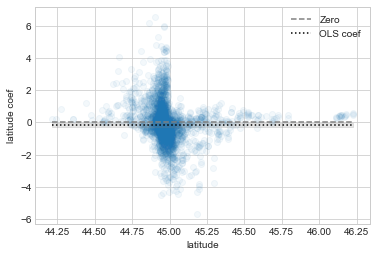

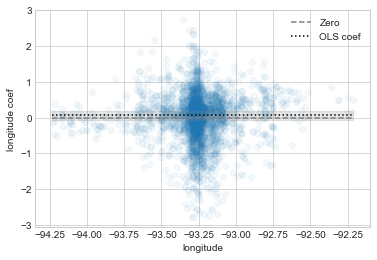

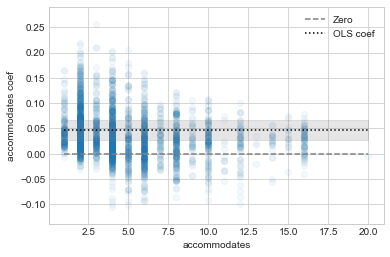

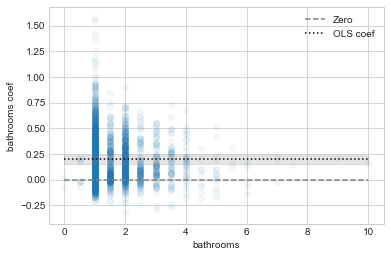

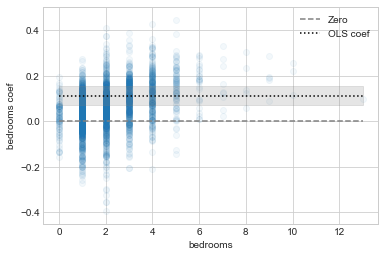

...

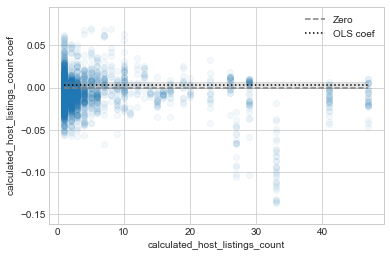

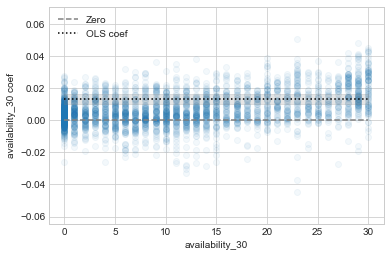

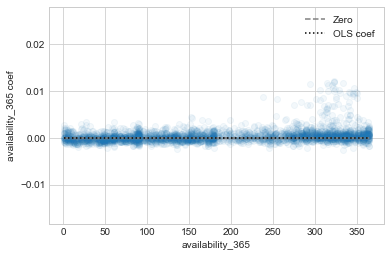

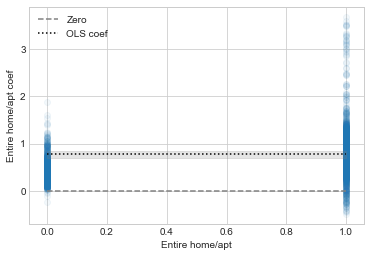

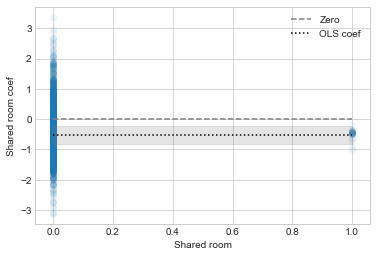

In [35]:
import plotcoefs

plotcoefs.plot_coefs_by_self(features, dnn_coefs, results)

## Location gradiants

If we think location coefficients as a 2-dimensional vector then its norm is a measure of effect of location on price.

In [36]:
location_sensitivity = dnn_coefs[['latitude', 'longitude']].apply(
    np.linalg.norm, axis=1)

mapairbnb.plot(data, features, color_by=location_sensitivity,
               color_title='location sensitivity', hover=False)

We see listings that are very sensitive mixed among ones that are not. So location sensitivity must be driven by features other than location itself. 

In [37]:
location_sensitivity.name = 'loc_sens'
with_loc_sens = features.join(location_sensitivity).sort_values(by='loc_sens')

# Pick a few listings from the high end of the sensitivity sort
# and use them to get a location valuation plot
for p in np.linspace(0.9, 1, 5):

    i = int(p * (len(features)-1))

    fixed_app = with_loc_sens.iloc[i, :].drop('loc_sens')
    print(with_loc_sens.iloc[i, :].drop(['latitude', 'longitude']))

    location_only = fixcolumns.fix(data=features,
                                   fix_columns=features.columns[2:],
                                   fix_on=fixed_app.values)

    location_predicted = model.predict(
        scaler.transform(location_only)).flatten()

    mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
                   color_title='Predicted price', hover=False, zoom=8).show()

accommodates                        8.000000
bathrooms                           4.000000
bedrooms                            3.000000
beds                                3.000000
minimum_nights                      3.000000
days_since_last_review             55.000000
number_of_reviews                   2.000000
reviews_per_month                   0.110000
calculated_host_listings_count      1.000000
availability_30                    30.000000
availability_365                  270.000000
Entire home/apt                     1.000000
Shared room                         0.000000
loc_sens                            2.229833
Name: 2379, dtype: float64


accommodates                        2.000000
bathrooms                           1.000000
bedrooms                            1.000000
beds                                1.000000
minimum_nights                      1.000000
days_since_last_review            308.000000
number_of_reviews                   3.000000
reviews_per_month                   0.270000
calculated_host_listings_count      2.000000
availability_30                    20.000000
availability_365                   73.000000
Entire home/apt                     0.000000
Shared room                         0.000000
loc_sens                            2.495961
Name: 4334, dtype: float64


accommodates                       8.000000
bathrooms                          2.000000
bedrooms                           4.000000
beds                               4.000000
minimum_nights                     5.000000
days_since_last_review            40.000000
number_of_reviews                 16.000000
reviews_per_month                  1.120000
calculated_host_listings_count     1.000000
availability_30                    2.000000
availability_365                   3.000000
Entire home/apt                    1.000000
Shared room                        0.000000
loc_sens                           2.819982
Name: 3544, dtype: float64


accommodates                        4.000000
bathrooms                           1.000000
bedrooms                            2.000000
beds                                3.000000
minimum_nights                      1.000000
days_since_last_review             28.000000
number_of_reviews                   3.000000
reviews_per_month                   1.580000
calculated_host_listings_count      1.000000
availability_30                    30.000000
availability_365                  180.000000
Entire home/apt                     0.000000
Shared room                         0.000000
loc_sens                            3.427378
Name: 6207, dtype: float64


accommodates                        4.000000
bathrooms                           1.000000
bedrooms                            1.000000
beds                                2.000000
minimum_nights                      2.000000
days_since_last_review             74.000000
number_of_reviews                   3.000000
reviews_per_month                   0.060000
calculated_host_listings_count      8.000000
availability_30                     0.000000
availability_365                  171.000000
Entire home/apt                     1.000000
Shared room                         0.000000
loc_sens                            6.632185
Name: 161, dtype: float64


Maps for high location sensitivity listings are generally better. Can we do any better still?

# Finally: location!
 

Let's build a model where location is not allowed to interact with anything else.

In [38]:
%%writefile loc_dnn.py
import tensorflow.keras as keras
from tf_r2 import R_squared


def build_model(
        input_shape,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2,
        optimizer=keras.optimizers.SGD(0.05)):

    inputs = keras.Input(shape=input_shape)

    # Seperate the location on the first two indexes from the rest of
    # the inputs.
    loc = inputs[:, :2]
    for i in range(n_hidden):
        loc = keras.layers.Dense(width, activation=activation)(loc)
        loc = keras.layers.Dropout(dropout)(loc)
    loc = keras.layers.Dense(1)(loc)

    rest = inputs[:, 2:]
    for i in range(n_hidden):
        rest = keras.layers.Dense(width, activation=activation)(rest)
        rest = keras.layers.Dropout(dropout)(rest)
    rest = keras.layers.Dense(1)(rest)

    # Sum the two outputs so that they both have log price units.
    output = loc + rest

    loc_model = keras.Model(inputs=inputs, outputs=loc)
    full_model = keras.Model(inputs=inputs, outputs=output)

    full_model.compile(loss='mse',
                       optimizer=optimizer,
                       metrics=[R_squared])

    return full_model, loc_model


Overwriting loc_dnn.py


In [39]:
import loc_dnn

model_all, loc_model = loc_dnn.build_model(X_train.shape[1:])

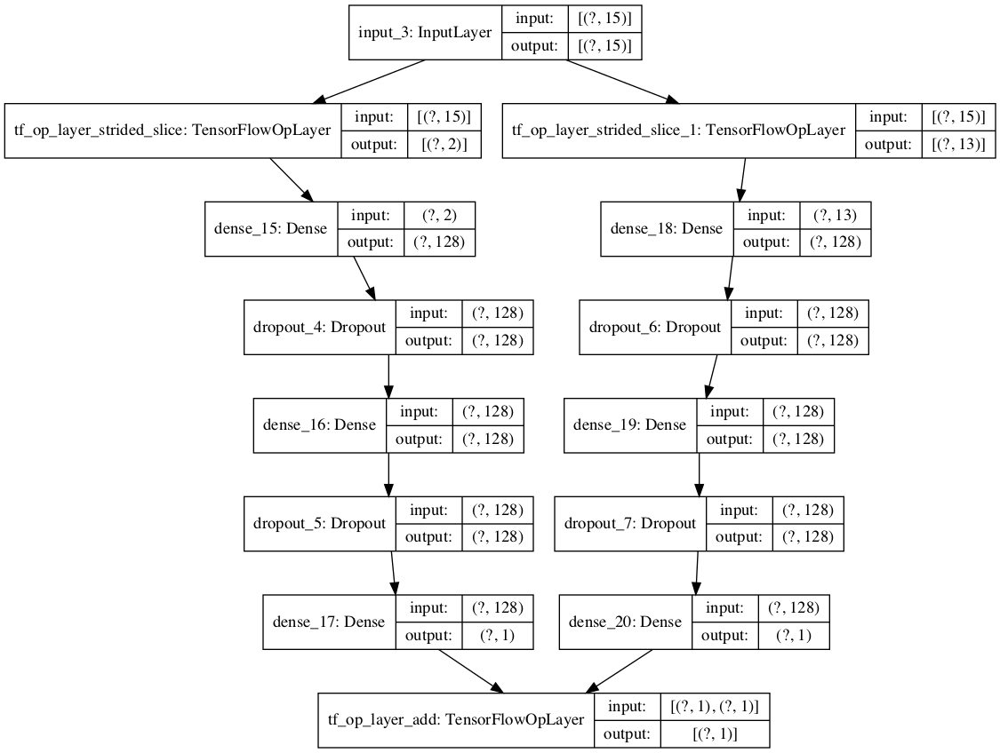

In [40]:
import tensorflow.keras as keras

keras.utils.plot_model(model_all, show_shapes=True)

In [41]:
history = train_dnn.train(model_all, X_train_scaled, y_train, X_test_scaled, y_test)

Train on 2208 samples, validate on 736 samples
Epoch 1/1000
2208/2208 [==============================] - 1s 288us/sample - loss: 1.2980 - R_squared: -0.4662 - val_loss: 0.4093 - val_R_squared: 0.4631
Epoch 2/1000
2208/2208 [==============================] - 0s 70us/sample - loss: 0.4798 - R_squared: 0.4189 - val_loss: 0.3536 - val_R_squared: 0.5416
Epoch 3/1000
2208/2208 [==============================] - 0s 66us/sample - loss: 0.4321 - R_squared: 0.4760 - val_loss: 0.3473 - val_R_squared: 0.5445
Epoch 4/1000
2208/2208 [==============================] - 0s 76us/sample - loss: 0.4016 - R_squared: 0.5129 - val_loss: 0.3302 - val_R_squared: 0.5790
Epoch 5/1000
2208/2208 [==============================] - 0s 66us/sample - loss: 0.3880 - R_squared: 0.5273 - val_loss: 0.3232 - val_R_squared: 0.5871
Epoch 6/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.3787 - R_squared: 0.5462 - val_loss: 0.3276 - val_R_squared: 0.5873
Epoch 7/1000
2208/2208 [=====================

2208/2208 [==============================] - 0s 71us/sample - loss: 0.2723 - R_squared: 0.6805 - val_loss: 0.3015 - val_R_squared: 0.6220
Epoch 55/1000
2208/2208 [==============================] - 0s 67us/sample - loss: 0.2629 - R_squared: 0.6814 - val_loss: 0.3014 - val_R_squared: 0.6211
Epoch 56/1000
2208/2208 [==============================] - 0s 56us/sample - loss: 0.2694 - R_squared: 0.6691 - val_loss: 0.3013 - val_R_squared: 0.6218
Epoch 57/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.2598 - R_squared: 0.6894 - val_loss: 0.2905 - val_R_squared: 0.6316
Epoch 58/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.2661 - R_squared: 0.6827 - val_loss: 0.2944 - val_R_squared: 0.6274
Epoch 59/1000
2208/2208 [==============================] - 0s 65us/sample - loss: 0.2709 - R_squared: 0.6697 - val_loss: 0.3052 - val_R_squared: 0.6168
Epoch 60/1000
2208/2208 [==============================] - 0s 49us/sample - loss: 0.2707 - R_squared: 

Epoch 108/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.2397 - R_squared: 0.7132 - val_loss: 0.2891 - val_R_squared: 0.6347
Epoch 109/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.2454 - R_squared: 0.7024 - val_loss: 0.3038 - val_R_squared: 0.6195
Epoch 110/1000
2208/2208 [==============================] - 0s 57us/sample - loss: 0.2434 - R_squared: 0.7104 - val_loss: 0.2968 - val_R_squared: 0.6278
Epoch 111/1000
2208/2208 [==============================] - 0s 56us/sample - loss: 0.2445 - R_squared: 0.7063 - val_loss: 0.3024 - val_R_squared: 0.6221
Epoch 112/1000
2208/2208 [==============================] - 0s 51us/sample - loss: 0.2371 - R_squared: 0.7159 - val_loss: 0.3028 - val_R_squared: 0.6213
Epoch 113/1000
2208/2208 [==============================] - 0s 52us/sample - loss: 0.2425 - R_squared: 0.7082 - val_loss: 0.2932 - val_R_squared: 0.6323
Epoch 114/1000
2208/2208 [==============================] - 0s 52us/sample - loss:

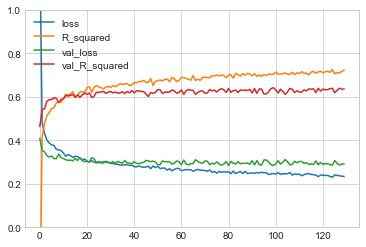

In [42]:
pd.DataFrame(history.history).plot(ylim=(0, 1), grid=True)

In [43]:
loc_DNN_r2 = dict(
    Train=tf_r2.R_squared(
        y_train, model_all.predict(X_train_scaled).flatten()).numpy(),
    Test=tf_r2.R_squared(
        y_test, model_all.predict(X_test_scaled).flatten()).numpy())

pd.DataFrame([OLS_r2, DNN_r2, loc_DNN_r2], index=['OLS R2', 'DNN R2',
                                                  'loc DNN R2'])

,Train,Test
OLS R2,0.601956,0.540067
DNN R2,0.760207,0.619105
loc DNN R2,0.747152,0.643996


In [44]:
location_predicted = loc_model.predict(scaler.transform(features)).flatten()

mapairbnb.plot(data, features, color_by=location_predicted,
               color_title='Diff log price', hover=False, zoom=8)